# Tasks
- Data Loader - Need Phase and Elastograms
- Data Visualization
  - Samples in 1x4 plot
- Set up VAE and UNet 

# Imports

In [23]:
%matplotlib inline  

import os
import pydicom
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from IPython.display import Image

from PIL import Image
import time
import random

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger

import torchvision.transforms.functional as TF
from scipy.ndimage import gaussian_filter

## Seeds

In [2]:
seed = 42
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

# Dataset Creation Helpers

In [3]:
data_dir = "C:\\Users\\hnieves6\\OneDrive - Georgia Institute of Technology\\BRHML\\AutoSpine\\Andy\\Artifact Detection\\Data\\MRE QC dataset\\MRE QC dataset Murat Seg"
excel_path = "C:\\Users\\hnieves6\\OneDrive - Georgia Institute of Technology\\BRHML\\AutoSpine\\Andy\\Artifact Detection\\Data\\MRE QC dataset\\MRE_QC dataset 3 observers.xlsx"


In [4]:
def create_data_lists(data_dir, excel_path):
    """
    Creates list of raw and processed MRE data for MRE Segmentation
    -   data_dir: File path containing the raw MRE data folders
    -   excel_path: str of Efe's organized labeled Excel sheet of the MRE data
    return:
    -   data: List of tuples containing np arrays of [(magnitude image (224,224), normalized and standardized magnitude image (224,224), segmentation mask (224,224), stiffness image (224,224), binarized confidence map (224,224), magnitdue quality label (scalar))]
    -   processed_magnitude_image_list: List containing np arrays of (224,224) processed magnitude images
    -   segmentation_mask_list: List containing np arrays of (224,224) true segmentation masks
    """
    data=[]
    processed_magnitude_image_list=[]
    segmentation_mask_list=[]
    phase_slice_list = []
    data_df = pd.read_excel(excel_path)  
    # Define the Resize transformation
    resize_transform = transforms.Resize(size=(224, 224))
    
    for idx in range(0,len(data_df)):
        
        folder_name = data_df.loc[idx, 'New Patient ID']
        slice_number = data_df.loc[idx, 'Slice #']
        magnitude_quality = data_df.loc[idx, 'Final observer score']
    
        #paths to subfolders
        magnitude_path = os.path.join(data_dir, folder_name, 'Magnitude/')
        phase_path = os.path.join(data_dir, folder_name, 'Phase/')
        segmentation_path = os.path.join(data_dir, folder_name, 'Segmentation_Murat/')
        stiffness_path = os.path.join(data_dir, folder_name, 'Stiffness/')
        confidence_map_path = os.path.join(data_dir,folder_name,'Confidence/')
    
        # # Load magnitude image
        # try:
        #     magnitude_image_path = os.path.join(magnitude_path, f'Magnitude_Slice_{slice_number}')
        #     magnitude_image = pydicom.dcmread(magnitude_image_path).pixel_array
        #     magnitude_image = np.array(magnitude_image, dtype=np.float32)
        #     #normalize
        #     z_score_normalized_image = (magnitude_image - np.mean(magnitude_image)) / np.std(magnitude_image)
        #     #min max standardize
        #     normalized_and_standardized_image = (z_score_normalized_image - np.min(z_score_normalized_image)) / (np.max(z_score_normalized_image) - np.min(z_score_normalized_image))
        #     normalized_and_standardized_image = Image.fromarray(normalized_and_standardized_image).resize((224, 224))
        #     normalized_and_standardized_image = np.array(normalized_and_standardized_image, dtype=np.float32)
        #     normalized_and_standardized_image = np.expand_dims(normalized_and_standardized_image, axis=0)
    
        # except:
        #     magnitude_image = None

        try:
            phase_array = np.zeros([224,224,1])
            for time_num in range(1,5):
                label = f'Phase_Slice{slice_number}_Time{time_num}'
                phase_image_path = os.path.join(phase_path, label)
                phase_image = pydicom.dcmread(phase_image_path).pixel_array
                phase_image = np.array(phase_image, dtype=np.float32)
                phase_image = Image.fromarray(phase_image).resize((224, 224))
                phase_image = np.array(phase_image, dtype=np.float32)
                phase_image = np.expand_dims(phase_image, axis=2) # 0
                phase_array = np.concatenate((phase_array, phase_image), axis=2) # 0
            phase_array = phase_array[:,:,1:]
    
        except:
            phase_image = None
            print(idx,folder_name, slice_number)
            continue
    
        # # Load segmentation image
        # try:
        #     segmentation_image_path = os.path.join(segmentation_path, f'Mask_Slice_{slice_number}.jpg')
        #     # Load the image using PIL
        #     segmentation_image = Image.open(segmentation_image_path).resize((224, 224))
        #     #convert to gray scale and threshold
        #     gray_image = np.array(segmentation_image.convert('L'), dtype=np.float32)
        #     gray_image[gray_image < 100] = 1
        #     gray_image[gray_image >= 100] = 0 # May 14, 2024
                    
        #     segmentation_image= gray_image
        #     segmentation_image = np.expand_dims(segmentation_image, axis=0)
    
        # except:
        #     segmentation_image = np.zeros([224,224])
        #     segmentation_image = np.expand_dims(segmentation_image, axis=0)
        # # Load stiffness image
        # try:
        #     stiffness_image_path = os.path.join(stiffness_path, f'Stiffness_Slice_{slice_number}')
        #     stiffness_image = pydicom.dcmread(stiffness_image_path).pixel_array  
        #     stiffness_image = Image.fromarray(stiffness_image).resize((224, 224))
        #     stiffness_image = np.array(stiffness_image)
        # except:
        #     stiffness_image = None
    
        # # Load confidence map image
        # try:
        #     confidence_map_image_path = os.path.join(confidence_map_path, f'Confidence_Map_{slice_number}')
        #     confidence_map_image = pydicom.dcmread(confidence_map_image_path).pixel_array
        #     confidence_map_image[confidence_map_image<950] = 0
        #     confidence_map_image[confidence_map_image>=950] = 1
        #     confidence_map_image = Image.fromarray(confidence_map_image).resize((224, 224))
        #     confidence_map_image = np.array(confidence_map_image)
    
        # except:
        #     confidence_map_image = None
    
        # data.append((magnitude_image, normalized_and_standardized_image, segmentation_image, stiffness_image, confidence_map_image, magnitude_quality))
        # processed_magnitude_image_list.append(normalized_and_standardized_image)
        # segmentation_mask_list.append(segmentation_image) 
        # return data, processed_magnitude_image_list, segmentation_mask_list
        phase_slice_list.append((folder_name, slice_number, phase_array))

    return phase_slice_list

In [5]:
def plot_phase_slice(phase_array):
    fs = 12
    fig,axes = plt.subplots(1,4,figsize = (20,20))
    if isinstance(phase_array, np.ndarray): 
        for time in range(len(phase_array)):
            axes[time].imshow(phase_array[:,:,time].squeeze(),cmap = 'gray')
            axes[time].set_title(f'Phase Offset {time+1}',color='black', fontsize = fs)
            axes[time].axis('off')
        plt.tight_layout()
        plt.show()

    elif isinstance(phase_array, torch.Tensor): 
        for time in range(len(phase_array)):
            axes[time].imshow(phase_array[time,:,:].squeeze(),cmap = 'gray')
            axes[time].set_title(f'Phase Offset {time+1}',color='black', fontsize = fs)
            axes[time].axis('off')
        plt.tight_layout()
        plt.show()
    else:
        raise Exception('Need type np.ndarray or torch.Tensor as input')

def phase_ani(phase_array):
    fs = 12
    fig, axes = plt.subplots(figsize=(4,4))
    if isinstance(phase_array, np.ndarray): 
        im = axes.imshow(phase_array[:,:,0].squeeze(),cmap = 'gray')
        axes.set_title(f'Phase Offset 1',color='black', fontsize = fs)
        axes.axis('off')
        def update(frame):
            im.set_data(phase_array[:,:,frame].squeeze())
            axes.set_title(f'Phase Offset {frame+1}',color='black', fontsize = fs)
            axes.axis('off')
            return [im]
        ani = animation.FuncAnimation(fig,update,frames=4,interval = 200,repeat=True)
        plt.close(fig)
        return HTML(ani.to_jshtml())

    elif isinstance(phase_array,torch.Tensor):
        im = axes.imshow(phase_array[0,:,:].squeeze(),cmap = 'gray')
        axes.set_title(f'Phase Offset 1',color='black', fontsize = fs)
        axes.axis('off')
        def update(frame):
            im.set_data(phase_array[frame,:,:].squeeze())
            axes.set_title(f'Phase Offset {frame+1}',color='black', fontsize = fs)
            axes.axis('off')
            return [im]
        ani = animation.FuncAnimation(fig,update,frames=4,interval = 200,repeat=True)
        plt.close(fig)
        return HTML(ani.to_jshtml())

    else:
        raise Exception('Need type np.ndarray or torch.Tensor as input')

In [6]:
class PhaseDataset(Dataset):
    def __init__(self,phase_list, input_layers = [0,1], transform = None):
        self.data = phase_list
        self.imgs = []
        self.transform = transform
        self.input_layers = input_layers
        for i in phase_list:
            self.imgs.append(transforms.ToTensor()(i[2]))
            
    def __len__(self):
        return len(self.imgs)

    def __getitem__(self,idx):
        phase_slice_images = self.imgs[idx]
        if self.transform:
            phase_slice_images = self.transform(phase_slice_images)
        partial_slice = phase_slice_images[self.input_layers]
        return partial_slice, phase_slice_images
        
    def getPatientID(self,idx):
        return self.data[idx][0]
        
    def getSliceInfo(self,idx):
        return self.data[idx][1]

In [9]:
phase_image_list = create_data_lists(data_dir, excel_path)
#a = PhaseDataset(phase_image_list)

97 7_V1_A1 10
158  10_V4_A3 1
159  10_V4_A3 2
160  10_V4_A3 3
161  10_V4_A3 4


In [11]:
train_indices = range(round(len(phase_image_list)*.7))
val_indices = range(train_indices[-1]+2,train_indices[-1]+round(len(phase_image_list)*.15))
test_indices = range(val_indices[-1]+2,len(phase_image_list))

In [12]:
bs = 16
train_dataloader = DataLoader(PhaseDataset(phase_image_list[train_indices[0]:train_indices[-1]]), batch_size = bs, shuffle=True)
val_dataloader = DataLoader(PhaseDataset(phase_image_list[val_indices[0]:val_indices[-1]]), batch_size = bs, shuffle=False)
test_dataloader = DataLoader(PhaseDataset(phase_image_list[test_indices[0]:test_indices[-1]]), batch_size = bs, shuffle=True)

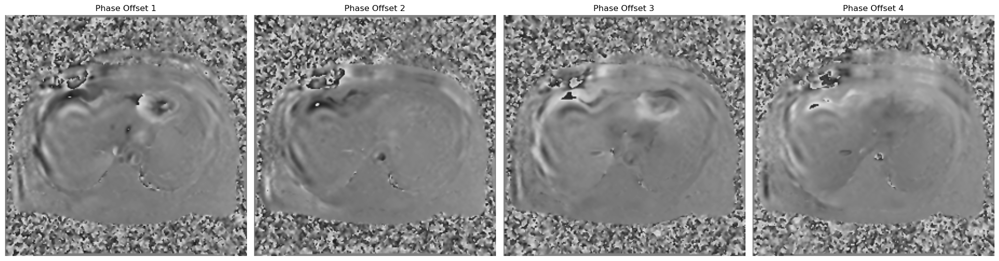

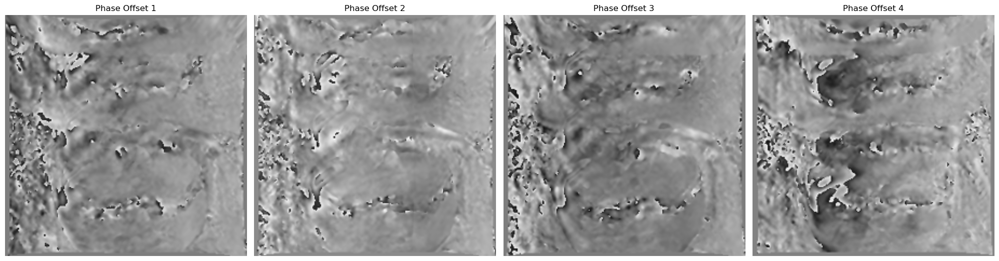

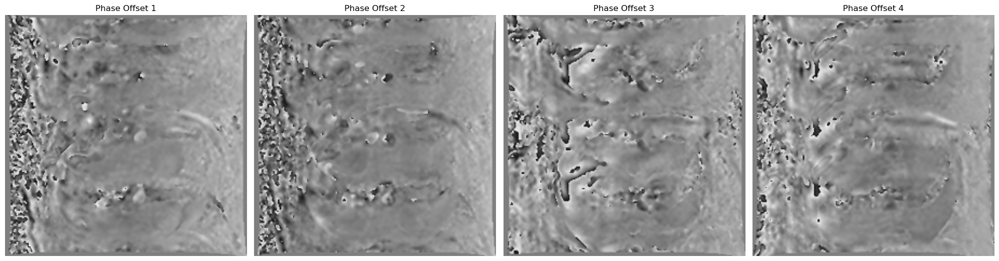

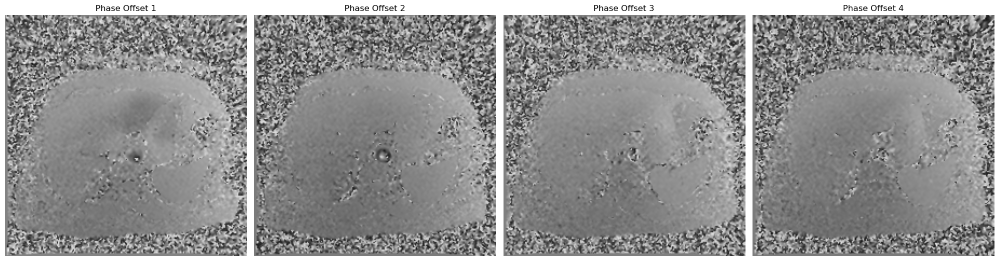

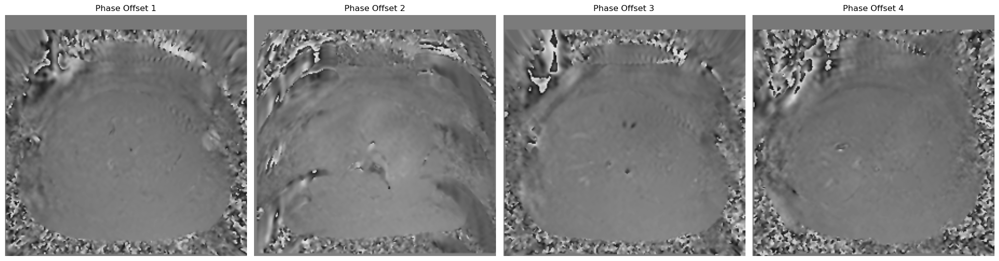

...

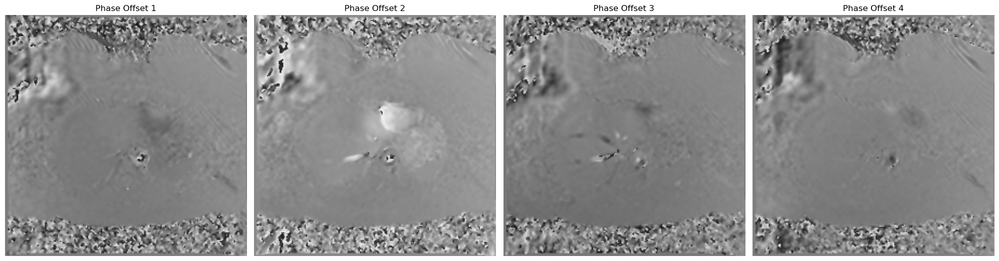

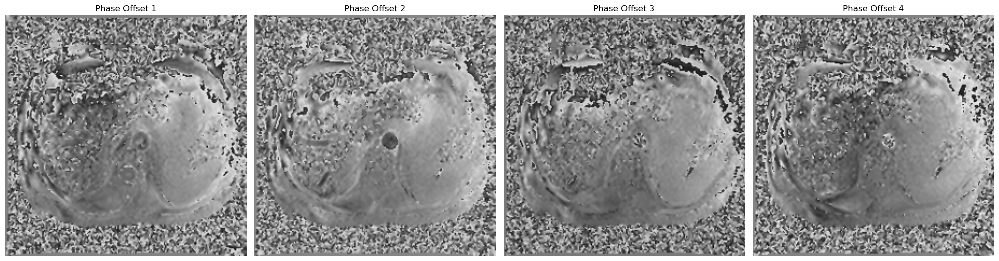

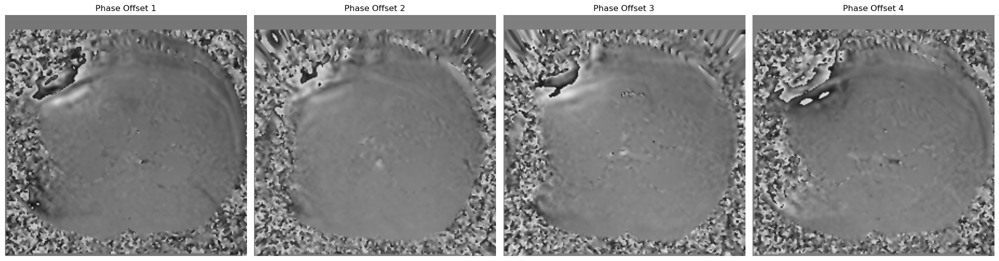

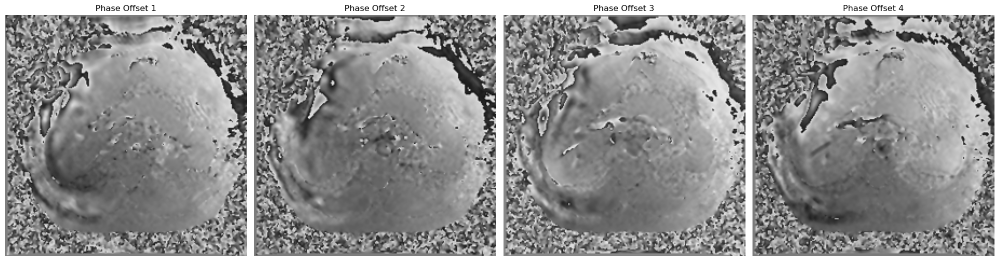

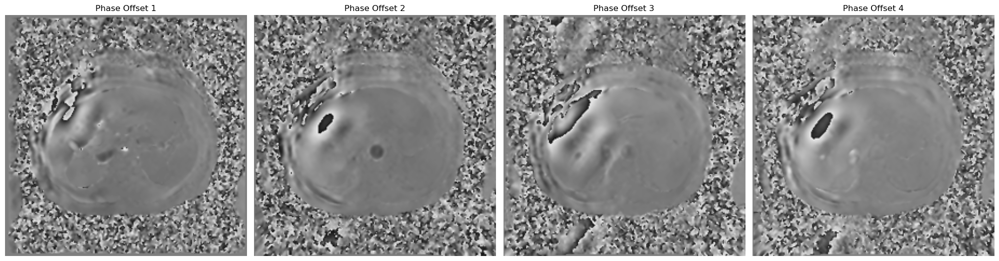

In [13]:
train_in,train_out = next(iter(train_dataloader))
for i in train_out:
    plot_phase_slice(i)

# VAE Architecture

In [77]:
class encoder(nn.Module):
    def __init__(self, latent_dim = 128):
        super(encoder,self).__init__()
        self.conv1 = nn.Conv2d(2,16,3, stride=2)
        self.conv2 = nn.Conv2d(16,32,3, stride=2)
        # self.pool = nn.MaxPool2d(2,2)
        self.lin1 = nn.Linear(96800,1000)
        self.mu = nn.Linear(1000, latent_dim)
        self.var = nn.Linear(1000,latent_dim)
    
    def forward(self,x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = torch.flatten(x,start_dim = 1)
        x = F.relu(self.lin1(x))
        mu = self.mu(x)
        var = self.var(x)
        return mu, var

class decoder(nn.Module):
    def __init__(self,latent_dim = 128):
        super(decoder,self).__init__()
        self.lin1 = nn.Linear(latent_dim, 1000)
        self.lin2 = nn.Linear(1000, 16*7*7)
        self.deconv1 = nn.ConvTranspose2d(16,8,4,stride=2,padding=1)
        self.deconv2 = nn.ConvTranspose2d(8,4,4, stride=2,padding=1)
        self.deconv3 = nn.ConvTranspose2d(4,4,4,stride=2,padding=1)
        self.deconv4 = nn.ConvTranspose2d(4,4,4,stride=2,padding=1)
        self.deconv5 = nn.ConvTranspose2d(4,4,4,stride=2,padding=1)

    def forward(self,x):
        x = F.relu(self.lin1(x))
        x = F.relu(self.lin2(x))
        x = x.view(-1,16,7,7)
        x = F.relu(self.deconv1(x))
        x = F.relu(self.deconv2(x))
        x = F.relu(self.deconv3(x))
        x = F.relu(self.deconv4(x))
        x = self.deconv5(x)
        return x
        
class VAE(nn.Module):
    def __init__(self):
        super(VAE,self).__init__()
        self.enc = encoder()
        self.dec = decoder()

    def forward(self,x):
        mu,var = self.enc(x)
        
        # reparameterize
        std = torch.exp(var/2)
        eps = torch.rand_like(std)
        xsample = eps.mul(std).add(mu)

        pred = self.dec(xsample)
        return pred, mu, var
        
# Create the model and move it to the device
enc = encoder().to('cuda')
dec = decoder().to('cuda')        
a=VAE().to('cuda')

In [74]:
from torchsummary import summary
summary(enc,(2,224,224), device = 'cuda')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 111, 111]             304
            Conv2d-2           [-1, 32, 55, 55]           4,640
            Linear-3                 [-1, 1000]      96,801,000
            Linear-4                  [-1, 128]         128,128
            Linear-5                  [-1, 128]         128,128
Total params: 97,062,200
Trainable params: 97,062,200
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.38
Forward/backward pass size (MB): 2.25
Params size (MB): 370.26
Estimated Total Size (MB): 372.90
----------------------------------------------------------------


In [75]:
summary(dec,(1,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1              [-1, 1, 1000]         129,000
            Linear-2               [-1, 1, 784]         784,784
   ConvTranspose2d-3            [-1, 8, 14, 14]           2,056
   ConvTranspose2d-4            [-1, 4, 28, 28]             516
   ConvTranspose2d-5            [-1, 4, 56, 56]             260
   ConvTranspose2d-6          [-1, 4, 112, 112]             260
   ConvTranspose2d-7          [-1, 4, 224, 224]             260
Total params: 917,136
Trainable params: 917,136
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 2.06
Params size (MB): 3.50
Estimated Total Size (MB): 5.56
----------------------------------------------------------------


In [83]:
summary(a,(2,224,224), device = 'cuda')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 111, 111]             304
            Conv2d-2           [-1, 32, 55, 55]           4,640
            Linear-3                 [-1, 1000]      96,801,000
            Linear-4                  [-1, 128]         128,128
            Linear-5                  [-1, 128]         128,128
           encoder-6     [[-1, 128], [-1, 128]]               0
            Linear-7                 [-1, 1000]         129,000
            Linear-8                  [-1, 784]         784,784
   ConvTranspose2d-9            [-1, 8, 14, 14]           2,056
  ConvTranspose2d-10            [-1, 4, 28, 28]             516
  ConvTranspose2d-11            [-1, 4, 56, 56]             260
  ConvTranspose2d-12          [-1, 4, 112, 112]             260
  ConvTranspose2d-13          [-1, 4, 224, 224]             260
          decoder-14          [-1, 4, 2